# Code embedding using Keras

In [6]:
#TODO add keras history plot

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
font = {'weight': 'bold', 'size': 20}
plt.rc('font', **font)

## Load data

In [9]:
dataframe = pd.read_json('../data/full_data.json')

In [10]:
dataframe.head(2)

,data_source,label,file_name,is_header,content
0,crypto-library,1,nettle/eddsa-hash.c,False,/* eddsa-hash.c\n\n Copyright (C) 2014 Niels...
1,crypto-library,1,nettle/twofishdata.c,False,/* twofishdata.c\n\n Generates the permutati...


In [11]:
'{:,}'.format(len(dataframe))

'10,736'

Target value:

In [12]:
dataframe.label.value_counts()

0    9465
1    1271
Name: label, dtype: int64

Remove comments:

Grab docs (code submissions) and labels (correct or not):

In [13]:
import re

def remove_comments(string):
    # remove all occurrences streamed comments (/*COMMENT */) from string
    string = re.sub(re.compile(r"/\*.*?\*/",re.DOTALL ) , "" , string) 
    # remove all occurrence single-line comments (//COMMENT\n ) from string
    string = re.sub(re.compile(r"//.*?\n" ) , "" , string)
    return string


def get_docs_and_labels(df):
    _docs = []
    _labels = []
    for index in df.index:
        # Program
        
        code = remove_comments(
            df.at[index, 'content']
        )
        _docs.append(code)
        # Label
        label = int(df.at[index, 'label'])
        _labels.append(label)
    return _docs, _labels

In [14]:
docs, labels = get_docs_and_labels(dataframe)

In [15]:
'{:,}'.format(len(docs))

'10,736'

In [16]:
for item in dataframe.loc[1:1,'content'].iteritems():
    print(item)

(1, '/* twofishdata.c\n\n   Generates the permutations q0 and q1 for twofish.\n\n   Copyright (C) 1999 Ruud de Rooij <ruud@debian.org>\n\n   This program is free software; you can redistribute it and/or modify\n   it under the terms of the GNU General Public License as published by\n   the Free Software Foundation; either version 2 of the License, or\n   (at your option) any later version.\n\n   This program is distributed in the hope that it will be useful,\n   but WITHOUT ANY WARRANTY; without even the implied warranty of\n   MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the\n   GNU General Public License for more details.\n\n   You should have received a copy of the GNU General Public License\n   along with this program; if not, write to the Free Software\n   Foundation, Inc., 51 Franklin Street, Fifth Floor, Boston, MA\n   02111-1301  USA.\n */\n\n#include <stdio.h>\n\n#define ror4(x) (((x) >> 1) | (((x) & 1) << 3))\n\nstatic unsigned char q0(unsigned char x)\n{\n    st

## Tokenize code and generate sequences

In [48]:
import os
#To ignore the warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.preprocessing.text import Tokenizer, text_to_word_sequence

In [18]:
#We set the size of the vocabulary
NUM_WORDS = 10000

In [44]:
tokenizer = Tokenizer(num_words=NUM_WORDS, 
                     filters='\t\n,_', 
                     lower=True, 
                     split=' ', 
                     oov_token= 'UNK',
                     char_level=False)

In [45]:
tokenizer.fit_on_texts(docs)

In [46]:
test='/* twofishdata.c\n\n   Generates the permutations q0 and q1 for twofish.\n\n   Copyright (C) 1999 Ruud de Rooij <ruud@debian.org>\n\n   This program is free software; you can redistribute it and/or modify\n   it under the terms of the GNU General Public License as published by\n   the Free Software Foundation; either version 2 of the License, or\n   (at your option) any later version.\n\n   This program is distributed in the hope that it will be useful,\n   but WITHOUT ANY WARRANTY; without even the implied warranty of\n   MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the\n   GNU General Public License for more details.\n\n   You should have received a copy of the GNU General Public License\n   along with this program; if not, write to the Free Software\n   Foundation, Inc., 51 Franklin Street, Fifth Floor, Boston, MA\n   02111-1301  USA.\n */\n\n#include <stdio.h>\n\n#define ror4(x) (((x) >> 1) | (((x) & 1) << 3))\n\nstatic unsigned char q0(unsigned char x)\n{\n    static const unsigned char t0[16] = {\n      0x8, 0x1, 0x7, 0xD, 0x6, 0xF, 0x3, 0x2,\n      0x0, 0xB, 0x5, 0x9, 0xE, 0xC, 0xA, 0x4\n    };\n    static const unsigned char t1[16] = {\n      0xE, 0xC, 0xB, 0x8, 0x1, 0x2, 0x3, 0x5,\n      0xF, 0x4, 0xA, 0x6, 0x7, 0x0, 0x9, 0xD\n    };\n    static const unsigned char t2[16] = {\n      0xB, 0xA, 0x5, 0xE, 0x6, 0xD, 0x9, 0x0,\n      0xC, 0x8, 0xF, 0x3, 0x2, 0x4, 0x7, 0x1\n    };\n    static const unsigned char t3[16] = {\n      0xD, 0x7, 0xF, 0x4, 0x1, 0x2, 0x6, 0xE,\n      0x9, 0xB, 0x3, 0x0, 0x8, 0x5, 0xC, 0xA\n    };\n\n    unsigned char a0 = x / 16;\n    unsigned char b0 = x % 16;\n\n    unsigned char a1 = a0 ^ b0;\n    unsigned char b1 = a0 ^ ror4(b0) ^ ((8*a0) % 16);\n\n    unsigned char a2 = t0[a1];\n    unsigned char b2 = t1[b1];\n\n    unsigned char a3 = a2 ^ b2;\n    unsigned char b3 = a2 ^ ror4(b2) ^ ((8*a2) % 16);\n\n    unsigned char a4 = t2[a3];\n    unsigned char b4 = t3[b3];\n\n    unsigned char y = 16*b4 + a4;\n\n    return y;\n}\n\nstatic unsigned char q1(unsigned char x)\n{\n  static const unsigned char t0[16] = {\n    0x2, 0x8, 0xB, 0xD, 0xF, 0x7, 0x6, 0xE,\n    0x3, 0x1, 0x9, 0x4, 0x0, 0xA, 0xC, 0x5\n  };\n  static const unsigned char t1[16] = {\n    0x1, 0xE, 0x2, 0xB, 0x4, 0xC, 0x3, 0x7,\n    0x6, 0xD, 0xA, 0x5, 0xF, 0x9, 0x0, 0x8\n  };\n  static const unsigned char t2[16] = {\n    0x4, 0xC, 0x7, 0x5, 0x1, 0x6, 0x9, 0xA,\n    0x0, 0xE, 0xD, 0x8, 0x2, 0xB, 0x3, 0xF\n  };\n  static const unsigned char t3[16] = {\n    0xB, 0x9, 0x5, 0x1, 0xC, 0x3, 0xD, 0xE,\n    0x6, 0x4, 0x7, 0xF, 0x2, 0x0, 0x8, 0xA\n  };\n\n  unsigned char a0 = x / 16;\n  unsigned char b0 = x % 16;\n\n  unsigned char a1 = a0 ^ b0;\n  unsigned char b1 = a0 ^ ror4(b0) ^ ((8*a0) % 16);\n\n  unsigned char a2 = t0[a1];\n  unsigned char b2 = t1[b1];\n\n  unsigned char a3 = a2 ^ b2;\n  unsigned char b3 = a2 ^ ror4(b2) ^ ((8*a2) % 16);\n\n  unsigned char a4 = t2[a3];\n  unsigned char b4 = t3[b3];\n\n  unsigned char y = 16*b4 + a4;\n\n  return y;\n}\n\nint\nmain(void)\n{\n  unsigned i;\n\n  printf("static const uint8_t q0[256] = {");\n  for (i = 0; i < 256; i++) {\n    if ( (i % 8) == 0)\n      printf("\\n  ");\n    printf("0x%02X,", q0(i));\n  }\n  printf("\\n};\\n\\n");\n\n  printf("static const uint8_t q1[256] = {");\n  for (i = 0; i < 256; i++) {\n    if ( (i % 8) == 0)\n      printf("\\n  ");\n    printf("0x%02X,", q1(i));\n  }\n  printf("\\n};\\n");\n\n  return 0;\n}\n'

In [56]:
text_to_word_sequence( remove_comments(test), filters='\t\n,_', lower=True, split=' ')

['#include',
 '<stdio.h>',
 '#define',
 'ror4(x)',
 '(((x)',
 '>>',
 '1)',
 '|',
 '(((x)',
 '&',
 '1)',
 '<<',
 '3))',
 'static',
 'unsigned',
 'char',
 'q0(unsigned',
 'char',
 'x)',
 '{',
 'static',
 'const',
 'unsigned',
 'char',
 't0[16]',
 '=',
 '{',
 '0x8',
 '0x1',
 '0x7',
 '0xd',
 '0x6',
 '0xf',
 '0x3',
 '0x2',
 '0x0',
 '0xb',
 '0x5',
 '0x9',
 '0xe',
 '0xc',
 '0xa',
 '0x4',
 '};',
 'static',
 'const',
 'unsigned',
 'char',
 't1[16]',
 '=',
 '{',
 '0xe',
 '0xc',
 '0xb',
 '0x8',
 '0x1',
 '0x2',
 '0x3',
 '0x5',
 '0xf',
 '0x4',
 '0xa',
 '0x6',
 '0x7',
 '0x0',
 '0x9',
 '0xd',
 '};',
 'static',
 'const',
 'unsigned',
 'char',
 't2[16]',
 '=',
 '{',
 '0xb',
 '0xa',
 '0x5',
 '0xe',
 '0x6',
 '0xd',
 '0x9',
 '0x0',
 '0xc',
 '0x8',
 '0xf',
 '0x3',
 '0x2',
 '0x4',
 '0x7',
 '0x1',
 '};',
 'static',
 'const',
 'unsigned',
 'char',
 't3[16]',
 '=',
 '{',
 '0xd',
 '0x7',
 '0xf',
 '0x4',
 '0x1',
 '0x2',
 '0x6',
 '0xe',
 '0x9',
 '0xb',
 '0x3',
 '0x0',
 '0x8',
 '0x5',
 '0xc',
 '0xa',
 '};',
 'unsi

In [21]:
# Size of the vocabulary
len(tokenizer.word_index) 

1103720

In [40]:
tokenizer

In [22]:
# document_count: an integer count of the total number of documents that were used to fit the Tokenizer.
'Number docs: {:,}'.format(tokenizer.document_count)

'Number docs: 10,736'

In [23]:
# Number of occurences of if in the dataset
tokenizer.word_counts['if'] # index

122415

In [24]:
# word_docs: a dictionary of words and how many documents each appeared in.
tokenizer.word_docs['if']

5697

In [25]:
sequences = tokenizer.texts_to_sequences(docs)

Let's look at the length distribution of the sequences to know what max size to choose

In [69]:
test = tokenizer.texts_to_sequences(dataframe.iloc[0].content)

In [74]:
docs

['\n\n#if HAVE_CONFIG_H\n# include "config.h"\n#endif\n\n#include <assert.h>\n\n#include "eddsa.h"\n#include "eddsa-internal.h"\n\n#include "ecc.h"\n#include "ecc-internal.h"\n#include "nettle-internal.h"\n\nvoid\n_eddsa_hash (const struct ecc_modulo *m,\n\t     mp_limb_t *rp, const uint8_t *digest)\n{\n  size_t nbytes = 1 + m->bit_size / 8;\n  mpn_set_base256_le (rp, 2*m->size, digest, 2*nbytes);\n  m->mod (m, rp);\n}\n',
 '\n\n#include <stdio.h>\n\n#define ror4(x) (((x) >> 1) | (((x) & 1) << 3))\n\nstatic unsigned char q0(unsigned char x)\n{\n    static const unsigned char t0[16] = {\n      0x8, 0x1, 0x7, 0xD, 0x6, 0xF, 0x3, 0x2,\n      0x0, 0xB, 0x5, 0x9, 0xE, 0xC, 0xA, 0x4\n    };\n    static const unsigned char t1[16] = {\n      0xE, 0xC, 0xB, 0x8, 0x1, 0x2, 0x3, 0x5,\n      0xF, 0x4, 0xA, 0x6, 0x7, 0x0, 0x9, 0xD\n    };\n    static const unsigned char t2[16] = {\n      0xB, 0xA, 0x5, 0xE, 0x6, 0xD, 0x9, 0x0,\n      0xC, 0x8, 0xF, 0x3, 0x2, 0x4, 0x7, 0x1\n    };\n    static const 

In [73]:
test

[[115],
 [18],
 [],
 [197],
 [118],
 [118],
 [85],
 [53],
 [26],
 [131],
 [53],
 [85],
 [131],
 [1],
 [56],
 [],
 [],
 [],
 [],
 [],
 [56],
 [608],
 [104],
 [120],
 [60],
 [21],
 [164],
 [131],
 [8],
 [],
 [49],
 [56],
 [25],
 [],
 [76],
 [14],
 [33],
 [126],
 [],
 [54],
 [21],
 [197],
 [187],
 [85],
 [],
 [64],
 [1],
 [187],
 [187],
 [197],
 [60],
 [],
 [],
 [],
 [],
 [],
 [8],
 [131],
 [21],
 [85],
 [],
 [140],
 [21],
 [187],
 [197],
 [],
 [21],
 [85],
 [],
 [104],
 [53],
 [60],
 [8],
 [],
 [608],
 [140],
 [],
 [164],
 [54],
 [218],
 [],
 [54],
 [197],
 [8],
 [8],
 [187],
 [197],
 [1],
 [],
 [],
 [],
 [],
 [],
 [164],
 [54],
 [218],
 [],
 [54],
 [197],
 [8],
 [8],
 [187],
 [197],
 [],
 [21],
 [85],
 [],
 [140],
 [60],
 [197],
 [197],
 [],
 [85],
 [608],
 [140],
 [8],
 [269],
 [53],
 [60],
 [197],
 [52],
 [],
 [120],
 [608],
 [218],
 [],
 [56],
 [53],
 [54],
 [],
 [60],
 [197],
 [118],
 [21],
 [85],
 [8],
 [60],
 [21],
 [86],
 [218],
 [8],
 [197],
 [],
 [21],
 [8],
 [],
 [53],
 [54],


In [26]:
len_seqs = [len(s) for s in sequences]
np.mean(len_seqs), np.std(len_seqs), np.max(len_seqs)

(522.5789865871833, 3083.485407715706, 152082)

The mean is at 600 but the standard deviation is much bigger

In [27]:
MAX_LENGTH = 1000

Dictionary to transform a vector back to the program:

In [28]:
id_to_word = { v: k for k, v in tokenizer.word_index.items() }

In [29]:
id_to_word[1]

'='

In [65]:
tokenizer.one_hot([id_to_word[index] for index in sequences[0]][0:10].join(' '))

AttributeError: 'Tokenizer' object has no attribute 'one_hot'

Pad documents:

In [31]:
from keras.preprocessing.sequence import pad_sequences
# pad documents
padded_docs = pad_sequences(sequences, maxlen=MAX_LENGTH, padding='post')

In [32]:
padded_docs[0][0:10]

array([  52, 1513,   85,  574, 1572,   23,   12, 1280,   12,   12])

## Defining the model

In [33]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.layers import Embedding

#We add the epsilon to avoid any error in the function

def precision_(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
    
def recall_(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def f1(y_true, y_pred):
    
    precision = precision_(y_true, y_pred)
    recall = recall_(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def f2(y_true, y_pred):
    
    precision = precision_(y_true, y_pred)
    recall = recall_(y_true, y_pred)
    return 5*((precision*recall)/(4*precision+recall+K.epsilon()))

In [58]:
dataframe

,data_source,label,file_name,is_header,content
0,crypto-library,1,nettle/eddsa-hash.c,False,/* eddsa-hash.c\n\n Copyright (C) 2014 Niels...
1,crypto-library,1,nettle/twofishdata.c,False,/* twofishdata.c\n\n Generates the permutati...
2,crypto-library,1,nettle/umac32.c,False,/* umac32.c\n\n Copyright (C) 2013 Niels Möl...
3,crypto-library,1,nettle/cfb.h,True,/* cfb.h\n\n Cipher feedback mode.\n\n Cop...
4,crypto-library,1,nettle/eddsa.h,True,/* eddsa.h\n\n Copyright (C) 2014 Niels Möll...
...,...,...,...,...,...
10731,others,0,__math.h,True,/* Inline math functions for i387.\n Copyrig...
10732,others,0,__ocl_iterator.h,True,//\n// Copyright (c) 2015-2016 The Khronos Gro...
10733,others,0,暴力搜索_二维数组中查找.hpp,True,/*\n¶þÎ¬Êý×éÖÐ²éÕÒ https://www.nowcoder.com/pr...
10734,others,0,源.cpp,False,#include <iostream>\n#include <math.h>\n#inclu...


In [64]:
dataframe.iloc[0].content.splitlines()[5:18].text_to_word_sequence

AttributeError: 'list' object has no attribute 'text_to_word_sequence'

In [34]:
# define the model
model = Sequential()
model.add(Embedding(NUM_WORDS, 50, input_length=MAX_LENGTH))
model.add(Flatten())
model.add(Dropout(rate=0.3))
model.add(Dense(1, activation='sigmoid'))
    
model.compile(optimizer='adam', 
                  loss='binary_crossentropy', 
                  metrics=['acc', f1,f2,precision_,recall_])

print(model.summary())

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 1000, 50)          500000    
_________________________________________________________________
flatten (Flatten)            (None, 50000)             0         
_________________________________________________________________
dropout (Dropout)            (None, 50000)             0         
_________________________________________________________________
dense (Dense)                (None, 1)                 50001     
Total params: 550,001
Trainable params: 550,001
Non-trainable params: 0
_____________________

In [35]:
def plot(history):
  
  # The history object contains results on the training and test
  # sets for each epoch
    acc = history.history['recall_']
    val_acc = history.history['val_recall_']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Get the number of epochs
    epochs = range(len(acc))

    plt.title('Training and validation recall')
    plt.plot(epochs, acc, color='blue', label='Train')
    plt.plot(epochs, val_acc, color='orange', label='Val')
    plt.xlabel('Epoch')
    plt.ylabel('Recall')
    plt.legend()
    plt.savefig('../code_embedding/plots/training_recall.png')

    _ = plt.figure()
    plt.title('Training and validation loss')
    plt.plot(epochs, loss, color='blue', label='Train')
    plt.plot(epochs, val_loss, color='orange', label='Val')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig('../code_embedding/plots/training_loss.png')

In [57]:
df

NameError: name 'df' is not defined

In [36]:
from sklearn.model_selection import train_test_split

indices = np.arange(padded_docs.shape[0])

X_train, X_test, y_train, y_test,train_idx, test_idx = train_test_split(padded_docs, labels,indices, 
                                                    test_size=0.2, random_state=0,
                                                    stratify=labels)

In [37]:
#Checking the indexing
(X_test[0] == padded_docs[test_idx[0]]).all()

True

In [38]:
# fit the model

history = model.fit(X_train, 
          y_train,
          epochs=5,
          validation_data=(X_test,y_test))

Train on 8588 samples, validate on 2148 samples
Epoch 1/5
8588/8588 [==============================] - 7s 873us/sample - loss: 0.1929 - acc: 0.9305 - f1: 0.5185 - f2: 0.4847 - precision_: 0.6607 - recall_: 0.4710 - val_loss: 0.0886 - val_acc: 0.9669 - val_f1: 0.8296 - val_f2: 0.8162 - val_precision_: 0.8908 - val_recall_: 0.8142
Epoch 2/5
8588/8588 [==============================] - 7s 850us/sample - loss: 0.0608 - acc: 0.9799 - f1: 0.8850 - f2: 0.8716 - precision_: 0.9341 - recall_: 0.8673 - val_loss: 0.0720 - val_acc: 0.9739 - val_f1: 0.8466 - val_f2: 0.8363 - val_precision_: 0.8888 - val_recall_: 0.8348
Epoch 3/5
8588/8588 [==============================] - 8s 880us/sample - loss: 0.0350 - acc: 0.9881 - f1: 0.9331 - f2: 0.9210 - precision_: 0.9651 - recall_: 0.9150 - val_loss: 0.0690 - val_acc: 0.9758 - val_f1: 0.8568 - val_f2: 0.8538 - val_precision_: 0.8817 - val_recall_: 0.8564
Epoch 4/5
8588/8588 [==============================] - 7s 860us/sample - loss: 0.0242 - acc: 0.9923 - f

FileNotFoundError: [Errno 2] No such file or directory: '../code_embedding/plots/training_recall.png'

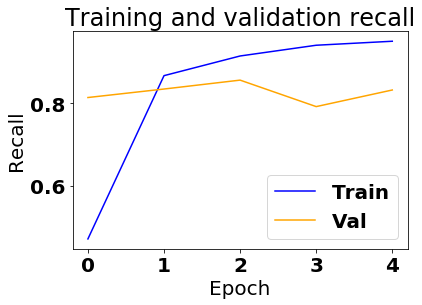

In [39]:
plot(history)

In [ ]:
# evaluate the model
word_loss, word_accuracy, word_f1,word_f2, word_precision, word_recall = model.evaluate(X_test, y_test, verbose=1)
print('Accuracy: %f, F1: %f, F2: %f, precision: %f, recall: %f' % (word_accuracy * 100, word_f1 * 100, word_f2 * 100, word_precision*100, word_recall*100))

In [ ]:
word_score = {
    'accuracy': word_accuracy,
    'F1': word_f1,
}
embeddings_scores = { 'Word': word_score }

In [ ]:
# Embedding Layer
embedding_layer = model.layers[0]
embeddings = embedding_layer.get_weights()[0]
print('Embedding Layer shape:', embeddings.shape)

In [ ]:
embeddings[0]

In [ ]:
np.save('../code_embedding/embedding/word_embeddings', embeddings)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principal_components = pca.fit_transform(embeddings)
print('PCA explained variance ratio:', pca.explained_variance_ratio_, 'Total:', sum(pca.explained_variance_ratio_))

In [ ]:
def get_top_words(tokenizer, N=50):
    
    return [word for word, occurrences in sorted(tokenizer.word_counts.items(), key=lambda t: t[1], reverse=True)[:N]]

In [ ]:
top_words = get_top_words(tokenizer)

In [ ]:
def plot_embeddings(low_dim_embs, id_to_word, top_words,id_plot, figsize=(8, 8)):

    plt.figure(figsize=figsize, dpi=100)
    #ax = plt.axes()
    #ax.yaxis.set_major_locator(plt.NullLocator())
    #ax.xaxis.set_major_locator(plt.NullLocator())
    i = 0
    while i < len(low_dim_embs):

        if i in id_to_word:
            
            x, y = low_dim_embs[i, :]
            word = id_to_word[i]

            if word in top_words:
                plt.scatter(x, y, color='b')
                plt.annotate(word,
                            xy=(x, y),
                            xytext=(5, 2),
                            textcoords='offset points',
                            ha='right',
                            va='bottom',
                            fontsize=14)
                plt.title("Embedding projected on PCA space")
        
        i += 1
    plt.savefig('../code_embedding/plots/pca_{}.png'.format(id_plot))

In [ ]:
plot_embeddings(principal_components, id_to_word, top_words,id_plot=0, figsize=(18, 18))

In [ ]:
plot_embeddings(principal_components, id_to_word, get_top_words(tokenizer, 20), id_plot=1)

Measure the distance between vectors:

In [ ]:
from scipy.spatial.distance import euclidean, cosine

def get_vector_distance(embeddings, tok, word1, word2):
    
    return euclidean(embeddings[tok.word_index[word1]], 
                     embeddings[tok.word_index[word2]])
    
def get_vector_cosine_distance(embeddings, tok, word1, word2):
    
    return cosine(embeddings[tok.word_index[word1]], 
                  embeddings[tok.word_index[word2]])

Cosine similarity:

In [ ]:
get_vector_cosine_distance(embeddings, tokenizer, 'x', 'y')

In [ ]:
get_vector_cosine_distance(embeddings, tokenizer, '<<', '=')

In [ ]:
get_vector_cosine_distance(embeddings, tokenizer, '+', '-')

In [ ]:
get_vector_cosine_distance(embeddings, tokenizer, '(', ')')

In [ ]:
get_vector_cosine_distance(embeddings, tokenizer, '{', '}')

Euclidean distance:

In [ ]:
get_vector_distance(embeddings, tokenizer, '<<', '>>')

In [ ]:
get_vector_distance(embeddings, tokenizer, 'x', 'y')

In [ ]:
get_vector_distance(embeddings,tokenizer, 'if', 'elif')

In [ ]:
get_vector_distance(embeddings, tokenizer, 'elif', 'else:')

In [ ]:
get_vector_distance(embeddings, tokenizer, '+', '-')

In [ ]:
get_vector_distance(embeddings, tokenizer, 'for', 'while')

## More complex architecture

In [ ]:
from keras.layers import Conv1D, BatchNormalization, Dropout, MaxPooling1D
from sklearn.metrics import f1_score

model = Sequential()
model.add(Embedding(NUM_WORDS, 50, input_length=MAX_LENGTH))
model.add(Conv1D(32, 15, strides=1, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D())
model.add(Conv1D(32,15, strides=1, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D())
model.add(Conv1D(32,10, strides=1, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D())
model.add(Conv1D(32,10, strides=1, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D())
model.add(Flatten())
model.add(Dropout(rate=0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', 
                  loss='binary_crossentropy', 
                  metrics=['acc', f1,f2,precision_,recall_])

print(model.summary())
                    